# Preprocessing of Casal Montserratina Datset

In [178]:
# Data Manipulation
import pandas as pd
import numpy as np
import os
# Plots
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf

# Functionalities
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.preprocessing import MinMaxScaler
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import pdist

# Others
import calendar
from datetime import timedelta 
import holidays

# Parameters Dict
parameters = {
    "paths": {
        "Consumption_2022_01_06": "../data/data_casal_montserratina/Casal_Montserratina_202201_202206.csv",
        "Consumption_2022_07_12": "../data/data_casal_montserratina/Casal_Montserratina_202207_202212.csv",
        "Consumption_2023_01_06": "../data/data_casal_montserratina/Casal_Montserratina_202301_202306.csv",
        "Consumption_2023_07_12": "../data/data_casal_montserratina/Casal_Montserratina_202307_202312.csv",
        "Consumption_2024_01_05": "../data/data_casal_montserratina/Casal_Montserratina_202401_202404.csv",
        "Consumption_2024_18_07": "../data/data_casal_montserratina/Casal_Montserratina_202405_202407.csv",
        "Meteorological": "../data/data_casal_montserratina/LaMonserratina_weather_&_PV.csv",
        "Results" : "../results/"
    }
}

### Functions

In [179]:
# Plots a time series curve
def grafico_zoom(df_x, df_y, title, yaxis_title, filename=None):
    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=df_x, 
        y=df_y, 
        mode='lines', 
        name='Line', 
        connectgaps=False 
    ))

    fig.update_layout(
        title=title,  
        xaxis_title="Date",
        yaxis_title=yaxis_title, 
        xaxis_tickangle=0, 
        showlegend=False
    )
    # Save the image with the specified filename
    if filename is not None:
        fig.write_image(f"../results/{filename}.png", format="png", scale=2, width=1000)
    fig.show()

In [180]:
# Checks the missing dates across all the time series dataset
def checkMissingData(df, date_column):
    min_date = df[date_column].min()
    max_date = df[date_column].max()

    date_range = pd.date_range(start=min_date, end=max_date, freq='h')
    missing_dates = date_range[~date_range.isin(df[date_column])]
    print(f"Number of Missing Values: {missing_dates.shape[0]}")
    return None if missing_dates.shape[0] == 0 else missing_dates, date_range

## Load and Prepare Datasets

In [181]:
# Load Energy Consumtion Dataset
consumption_path = "../data/data_casal_montserratina/"
df_1 = pd.read_csv(parameters["paths"]["Consumption_2022_01_06"], delimiter=";")
df_2 = pd.read_csv(parameters["paths"]["Consumption_2022_07_12"], delimiter=";")
df_3 = pd.read_csv(parameters["paths"]["Consumption_2023_01_06"], delimiter=";")
df_4 = pd.read_csv(parameters["paths"]["Consumption_2023_07_12"], delimiter=";")
df_5 = pd.read_csv(parameters["paths"]["Consumption_2024_01_05"], delimiter=";")
df_6 = pd.read_csv(parameters["paths"]["Consumption_2024_18_07"], delimiter=";")


In [182]:
# Concatenate the 4 datasets of Electricity Consumption
df = pd.concat([df_1, df_2, df_3, df_4, df_5, df_6], ignore_index=True)
df.drop_duplicates(inplace=True) # por si hay superposición entre los DF
df.head()

,TimeStamp,Valor,Període tarifari,Tipus lectura
0,01/01/2022 00:00,6,6,Real
1,01/01/2022 01:00,6,6,Real
2,01/01/2022 02:00,5,6,Real
3,01/01/2022 03:00,7,6,Real
4,01/01/2022 04:00,7,6,Real


In [183]:
df2 = df.copy(deep=True)

In [184]:
# Clean and Drop fields
df["TimeStamp"] = pd.to_datetime(df["TimeStamp"], format="%d/%m/%Y %H:%M")
df = df.drop(columns=["Tipus lectura", "Període tarifari"])
df.rename(columns={'TimeStamp': 'Date', 
                   'Valor': 'Consumo'}, inplace=True)

In [185]:
# Load Meteorolgical Dataset
df_PV = pd.read_csv(parameters["paths"]["Meteorological"])
df_PV['Date'] = pd.to_datetime(df_PV['Date'])
df_PV.set_index("Date", inplace=True)
df_PV = df_PV.resample('1h').mean()
df_PV.reset_index(inplace=True)
df_PV.head(5)

,Date,temperature_2m_C,relative_humidity_2m_%,dew_point_2m_C,apparent_temperature_C,pressure_msl_hPa,surface_pressure_hPa,cloud_cover_%,cloud_cover_high_%,et0_fao_evapotranspiration_mm,...,is_day,sunshine_duration_sec,shortwave_radiation_W/m2,direct_radiation_W/m2,diffuse_radiation_W/m2,direct_normal_irradiance_W/m2,global_tilted_irradiance_W/m2,terrestrial_radiation_W/m2,Temp_interna_Modulo_C,PV_kW
0,2021-01-01 00:00:00,7.76525,78.289806,4.22150,5.508863,1006.487477,1000.511047,39.075002,38.000,0.000576,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.740545,0.0
1,2021-01-01 01:00:00,6.19025,80.961248,3.15275,3.521368,1006.224978,1000.216370,45.225003,55.250,0.000967,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.029105,0.0
2,2021-01-01 02:00:00,5.15900,85.244406,2.88400,2.378472,1005.987477,999.958206,36.862503,84.375,0.000011,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.563281,0.0
3,2021-01-01 03:00:00,5.28400,87.411388,3.35900,2.768215,1005.724978,999.699951,44.100003,82.375,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.619745,0.0
4,2021-01-01 04:00:00,5.04650,90.309694,3.59025,2.600666,1005.525000,999.496155,44.512501,64.500,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.512464,0.0


### Merge Datasets

In [186]:
# Setting Date as Index for merging and then reset it
df.set_index("Date", inplace=True)
df_PV.set_index("Date", inplace=True)
merged_df = df.merge(df_PV, how="inner", on="Date")
merged_df.reset_index(inplace=True)
merged_df.head(2)

,Date,Consumo,temperature_2m_C,relative_humidity_2m_%,dew_point_2m_C,apparent_temperature_C,pressure_msl_hPa,surface_pressure_hPa,cloud_cover_%,cloud_cover_high_%,...,is_day,sunshine_duration_sec,shortwave_radiation_W/m2,direct_radiation_W/m2,diffuse_radiation_W/m2,direct_normal_irradiance_W/m2,global_tilted_irradiance_W/m2,terrestrial_radiation_W/m2,Temp_interna_Modulo_C,PV_kW
0,2022-01-01 00:00:00,6,7.79025,90.588577,6.34650,5.897182,1027.94995,1021.846619,50.512499,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.751838,0.0
1,2022-01-01 01:00:00,6,7.28400,89.860893,5.72775,5.195249,1027.55000,1021.438141,18.562499,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.523160,0.0


### <del>Calculating Demand = Consumption + Photovoltaic Generation</del>

In [187]:
# Demanda_kWh will be our target variable
#fecha_limite = pd.to_datetime('2022-06-19 00:00:00')
#merged_df.loc[merged_df["Date"] < fecha_limite, 'PV_kW'] = 0
#merged_df["Demanda_kWh"] = merged_df["Consumo"] + merged_df["PV_kW"]

In [188]:
merged_df = merged_df.drop(columns=["PV_kW"], axis=1)

## Process and Clean Datasets

### Missing Values

In [189]:
# Checking NaNs and Missing Values
print(f"NaN Count per Column", merged_df.isna().any(axis=1).sum())
missing_dates, date_range = checkMissingData(merged_df, 'Date')

NaN Count per Column 0
Number of Missing Values: 2906


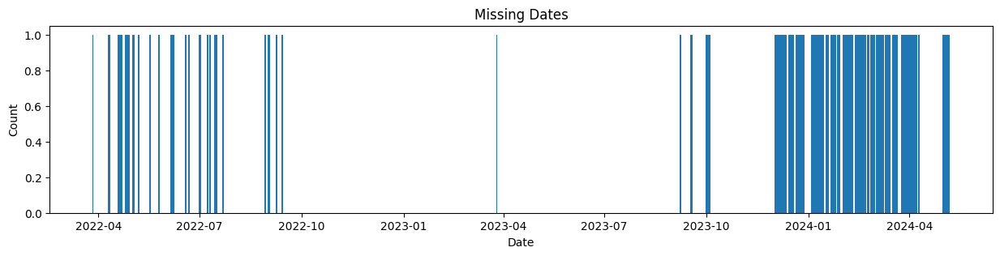

In [190]:
plt.figure(figsize=(15, 3))
plt.bar(missing_dates, [1] * len(missing_dates))
plt.title("Missing Dates")
plt.xlabel("Date")
plt.ylabel("Count")
plt.savefig("../results/missing_dates.png", bbox_inches='tight', dpi=300)
plt.show()

### Fill the Empty Spaces

In [191]:
# Drop duplicates
merged_df = merged_df.drop_duplicates(keep=False)
merged_df.set_index("Date", inplace=True)

# Reindex the Dataset filling all the empty spaces with NaNs
merged_df = merged_df.reindex(date_range)

merged_df.reset_index(inplace=True)
merged_df.rename(columns={'index': 'Date'}, inplace=True) 
missing_dates, date_range = checkMissingData(merged_df, 'Date')

Number of Missing Values: 0


In [192]:
grafico_zoom(merged_df["Date"], merged_df["Consumo"],
              "Consumo Eléctrico - Casal La Monserratina", "Consumo [kWh]", filename="curva_consumo_original")

### NaNs Assignment

1       2
24     28
48      7
72      6
96      7
120     4
144     1
168     1
Name: count, dtype: int64


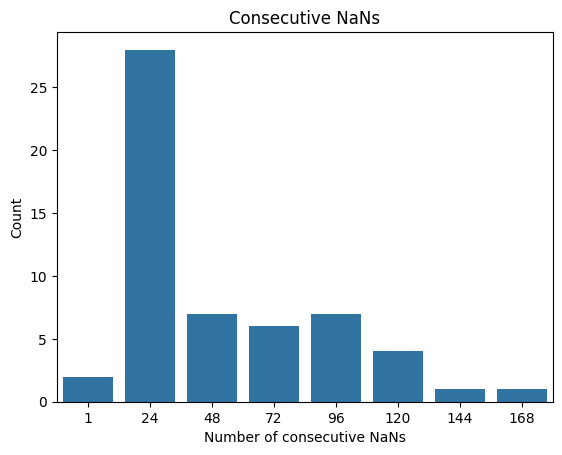

In [193]:
# Plot the Count of the Consecutive NaN Gaps
def plot_consecutive_nans(df, column):
    sr = df[column]
    nans = sr.isna()
    consecutive_nans = []
    count = 0

    for nan in nans:
        if nan:
            count += 1
        elif count > 0:
            consecutive_nans.append(count)
            count = 0
    
    if count > 0:
        consecutive_nans.append(count)

    count_series = pd.Series(consecutive_nans).value_counts().sort_index()
    print(count_series)

    ax = sns.barplot(x=count_series.index, y=count_series.values)
    ax.set_title('Consecutive NaNs')
    ax.set_xlabel('Number of consecutive NaNs')
    ax.set_ylabel('Count')

    plt.show()

plot_consecutive_nans(merged_df, "Consumo")

In [194]:
# Fill the gaps that are contained in a gap that has X consecutive NaNs
def fillGaps(df, max_gap=24):
    new_df = df.copy(deep=True)
    is_null = new_df["Consumo"].isnull()
    null_groups = (is_null != is_null.shift()).cumsum()
    group_sizes = is_null.groupby(null_groups).sum()
    valid_groups = group_sizes[group_sizes <= max_gap].index
    valid_mask = null_groups.isin(valid_groups) & is_null
    filtered_df = new_df[valid_mask].copy(deep=True)

    #1 Week
    filtered_df["Consumo_1w_before"] = new_df["Consumo"].shift(periods=24*7).fillna(0)
    #2 Week
    filtered_df["Consumo_2w_before"] = new_df["Consumo"].shift(periods=24*14).fillna(0)
    #3 Week
    filtered_df["Consumo_1w_after"] = new_df["Consumo"].shift(periods=-24*7).fillna(0)
    #4 Week
    filtered_df["Consumo_2w_after"] = new_df["Consumo"].shift(periods=-24*14).fillna(0)
    #Mean
    consumo_4w_mean = (filtered_df["Consumo_1w_before"] + filtered_df["Consumo_1w_after"] + filtered_df["Consumo_2w_before"] + filtered_df["Consumo_2w_after"]) / 4
    
    filtered_df['shifted_consumo'] = consumo_4w_mean[filtered_df.index]
    return filtered_df

filtered_df = fillGaps(merged_df)
merged_df.loc[filtered_df.index, 'Consumo'] = filtered_df['shifted_consumo']

48     7
72     6
96     7
120    4
144    1
168    1
Name: count, dtype: int64


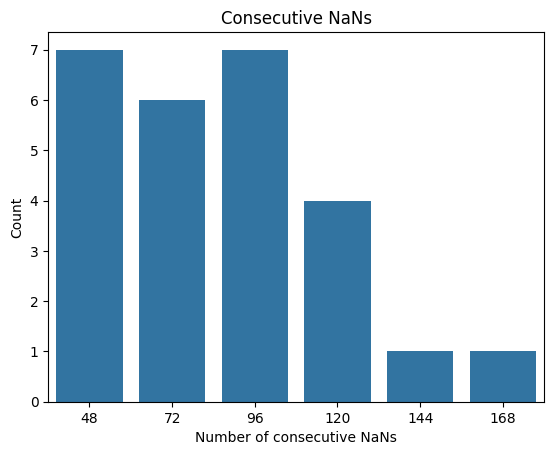

In [195]:
plot_consecutive_nans(merged_df, "Consumo")

In [196]:
def slicer_grafico(df, fecha_inicial, fecha_final, title, yaxis_title, filename=None):
    df_descarte = df.copy(deep=True)

    # Dividir los datos en dos partes
    df_1 = df_descarte[df_descarte.Date <= pd.to_datetime(fecha_final)]
    df_1 = df_1[df_1.Date >= pd.to_datetime(fecha_inicial)]
    df_2 = df_descarte[len(df_1):]

    fig = go.Figure()
    fig.add_trace(go.Scatter(
        x=df_descarte.Date, 
        y=df_descarte.Consumo, 
        mode='lines', 
        name='Parte del dataset que se descarta', 
        connectgaps=False,
        line=dict(color='lightgrey')  # Color gris claro
    ))
    fig.add_trace(go.Scatter(
        x=df_1.Date, 
        y=df_1.Consumo, 
        mode='lines', 
        name='Parte del dataset que se utilizará', 
        connectgaps=False,
        line=dict(color='blue')  # Color azul
    ))
    fig.update_layout(
            title=title,  
            xaxis_title="Date",
            yaxis_title=yaxis_title, 
            xaxis_tickangle=0, 
            legend=dict(
                x=0.74,
                y=0.98,
                bgcolor='rgba(255, 255, 255, 0.5)',
                bordercolor='rgba(0, 0, 0, 0.5)',
                borderwidth=1
            )
    )
    # Guardar la imagen en el archivo especificado
    # if filename is not None:
    #     fig.write_image(f"../results/{filename}.png", format="png", width=1000, scale=2)
    fig.show()
    
slicer_grafico(merged_df, 

    # # DF completo, es decir, sin cortes
    # "2022-01-01 00:00:00",  
    # "2024-07-18 23:00:00",

    # bloque central del DF
    "2022-07-02 00:00:00",  # Fecha inicial 
    "2023-11-30 23:00:00",  # Fecha final

    title="Bounded Electricity Demand", 
    yaxis_title="Consumption [kWh]",
    filename="ConsumoDescartada")

Due to the quantity of null values at the end of the dataset, the last 5 months of Consumption Data is discarded. It is also discarded the first 6 months of the data, because they contain very different values from the rest of the dataset. If there are more NaN values, they are dropped.

In [197]:
merged_df.dropna(inplace=True)
merged_df.isnull().any()

Date                             False
Consumo                          False
temperature_2m_C                 False
relative_humidity_2m_%           False
dew_point_2m_C                   False
apparent_temperature_C           False
pressure_msl_hPa                 False
surface_pressure_hPa             False
cloud_cover_%                    False
cloud_cover_high_%               False
et0_fao_evapotranspiration_mm    False
vapour_pressure_deficit_kPa      False
wind_speed_10m_km/h              False
wind_direction_10m_º             False
wind_gusts_10m                   False
is_day                           False
sunshine_duration_sec            False
shortwave_radiation_W/m2         False
direct_radiation_W/m2            False
diffuse_radiation_W/m2           False
direct_normal_irradiance_W/m2    False
global_tilted_irradiance_W/m2    False
terrestrial_radiation_W/m2       False
Temp_interna_Modulo_C            False
dtype: bool

### Slice Dataset

In [198]:
# Define start and end dates - 'YYYY-MM-DD HH:MM:SS'.
start_date = '2022-07-02 00:00:00'
end_date = '2023-11-30 23:00:00'

# DF completo, es decir, sin cortes
# start_date = '2022-01-02 00:00:00' # "2022-01-01 00:00:00",  
# end_date = "2024-07-18 23:00:00"

merged_df = merged_df.loc[(merged_df.Date >= pd.to_datetime(start_date, format='%Y-%m-%d %H:%M:%S'))]
merged_df = merged_df.loc[(merged_df.Date <= pd.to_datetime(end_date, format='%Y-%m-%d %H:%M:%S'))]

grafico_zoom(merged_df["Date"], merged_df["Consumo"],
              "Bounded Electricity Consumption Dataset", "Consumption [kWh]", filename="curva_consumo_acotada")

### Histogram

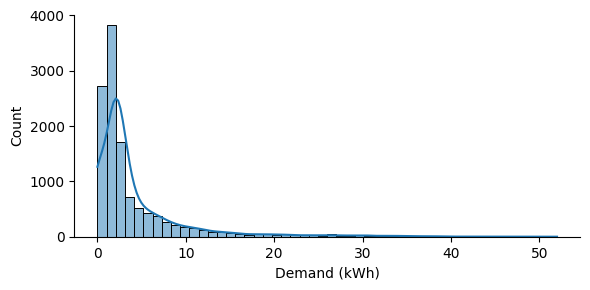

In [199]:
fg = sns.displot(merged_df['Consumo'], height=3, aspect= 2, bins=50, kde=True)
fg.set_axis_labels("Demand (kWh)", "Count")
fg.savefig("../results/histograma_original.png", bbox_inches='tight', dpi=300)

The histogram of the Demand is very skewed to the left, 

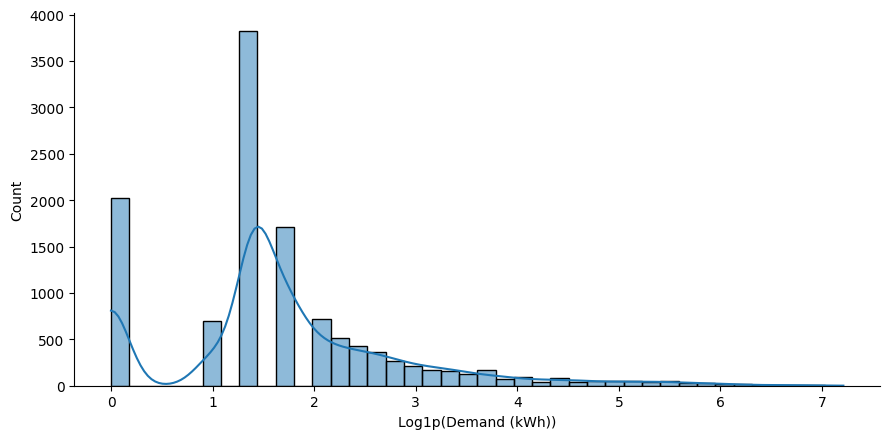

In [200]:
log_df = merged_df.copy(deep=True)
log_df["Consumo_log"] = np.sqrt(log_df["Consumo"])
fg = sns.displot(log_df['Consumo_log'], height=4.5, aspect= 2, bins=40, kde=True)
fg.set_axis_labels("Log1p(Demand (kWh))", "Count")
fg.savefig("../results/log_histogram.png", bbox_inches='tight', dpi=300)

In [201]:
import plotly.express as px
fig = px.box(merged_df, y='Consumo')
fig.show()

### Outliers of the Consumption

In [202]:
q1 = merged_df["Consumo"].quantile(0.25)
q3 = merged_df["Consumo"].quantile(0.75)
iqr = q3 - q1

#Calculate the lower abnd upper limits to identify the outliers
lim_inf = q1 - (1.5 * iqr)
lim_sup = q3 + (1.5 * iqr)
print(lim_sup)
outliers = ((merged_df["Consumo"] < lim_inf) | (merged_df["Consumo"] > lim_sup))
print(f"The Number of Outliers is {outliers.sum()}, {(outliers.sum()/len(merged_df))*100:.2f}%. The limits are {lim_inf} and {lim_sup}.\n")

9.5
The Number of Outliers is 1306, 10.82%. The limits are -2.5 and 9.5.



In [203]:
merged_df[["Consumo"]].describe()

,Consumo
count,12071.000000
mean,4.259051
std,5.814809
min,0.000000
25%,2.000000
50%,2.000000
75%,5.000000
max,52.000000


In [204]:
q1 = log_df["Consumo_log"].quantile(0.25)
q3 = log_df["Consumo_log"].quantile(0.75)
iqr = q3 - q1

#Calculate the lower abnd upper limits to identify the outliers
lim_inf = q1 - (1.5 * iqr)
lim_sup = q3 + (1.5 * iqr)

outliers = ((log_df["Consumo_log"] < lim_inf) | (log_df["Consumo_log"] > lim_sup))
print(f"The Number of Outliers is {outliers.sum()}. The limits are {lim_inf} and {lim_sup}.\n")

The Number of Outliers is 2874. The limits are 0.18143193968305327 and 3.4688496001898317.



In [205]:
fig = px.box(log_df, y='Consumo_log')
fig.show()

## Dataset Decomposition

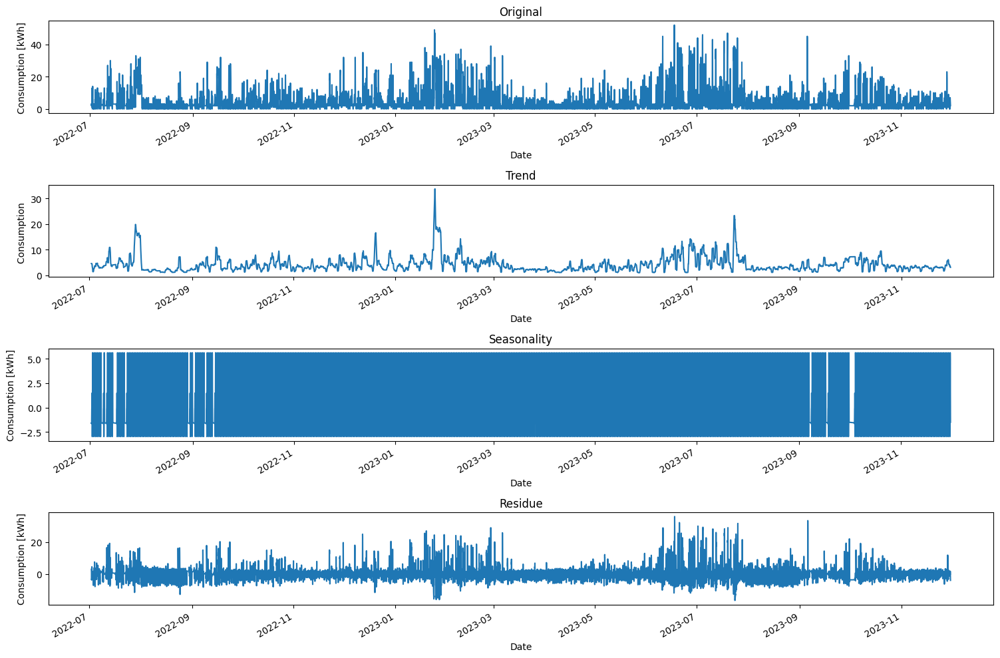

In [206]:
decomp_df = merged_df.copy(deep=True)
decomp_df.set_index("Date", inplace=True)
result = seasonal_decompose(decomp_df["Consumo"], model='additive', period=24)
decomp_df["Consumo_trend"] = result.trend
decomp_df["Consumo_seasonal"] = result.seasonal
decomp_df["Consumo_residual"] = result.resid

# Plot the decomposed time series
fig, axes = plt.subplots(4, 1, figsize=(15, 10))
decomp_df["Consumo"].plot(ax=axes[0],title="Original")
axes[0].set_xlabel("Date")
axes[0].set_ylabel("Consumption [kWh]")
decomp_df["Consumo_trend"].plot(ax=axes[1], title="Trend")
axes[1].set_xlabel("Date")
axes[1].set_ylabel("Consumption ")
decomp_df["Consumo_seasonal"].plot(ax=axes[2], title="Seasonality")
axes[2].set_xlabel("Date")
axes[2].set_ylabel("Consumption [kWh]")
decomp_df["Consumo_residual"].plot(ax=axes[3], title="Residue")
axes[3].set_xlabel("Date")
axes[3].set_ylabel("Consumption [kWh]")
plt.tight_layout()

plt.savefig("../results/seasonal_decompose.png", bbox_inches='tight', dpi=300)

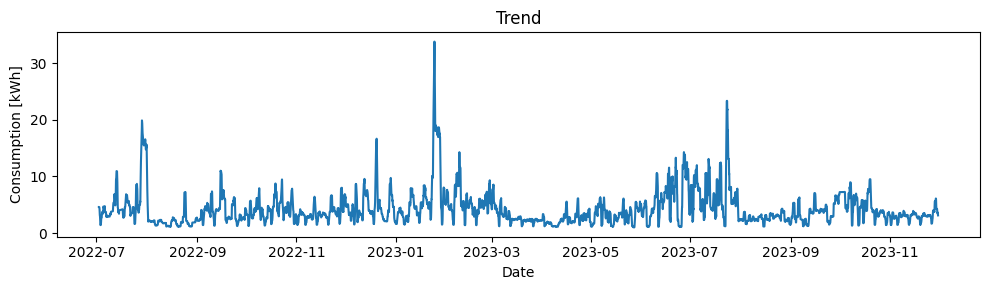

In [207]:
# Plot Trend
plt.figure(figsize=(10, 3))
plt.plot(decomp_df["Consumo_trend"])
plt.title("Trend")
plt.xlabel("Date")
plt.ylabel("Consumption [kWh]")
plt.tight_layout()
plt.savefig("../results/trend.png",  bbox_inches='tight', dpi=300)
plt.show()

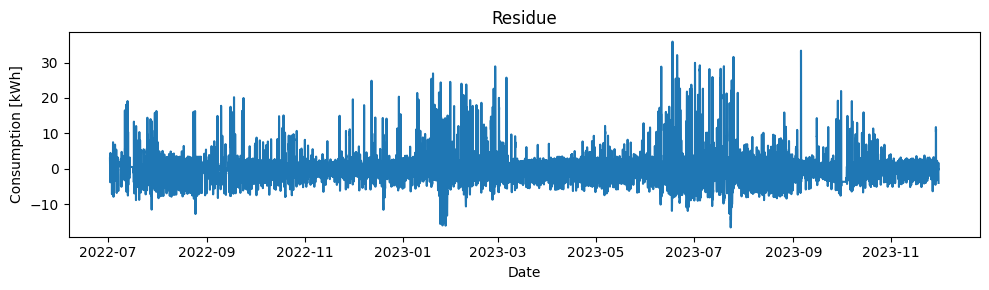

In [208]:
# Plot Residue
plt.figure(figsize=(10, 3))
plt.plot(decomp_df["Consumo_residual"])
plt.title("Residue")
plt.xlabel("Date")
plt.ylabel("Consumption [kWh]")
plt.tight_layout()
plt.savefig("../results/residue.png",  bbox_inches='tight', dpi=300)
plt.show()

### Seasonality

In [209]:
df_seasonal = decomp_df[["Consumo_seasonal"]].copy(deep=True)
df_seasonal = df_seasonal.loc[(df_seasonal.index >= pd.to_datetime('2023-01-05 00:00:00', format='%Y-%m-%d %H:%M:%S'))]
df_seasonal = df_seasonal.loc[(df_seasonal.index <= pd.to_datetime('2023-01-12 00:00:00', format='%Y-%m-%d %H:%M:%S'))]
grafico_zoom(df_seasonal.index, df_seasonal['Consumo_seasonal'],
              "Daily Seasonal Pattern in Consumption", "", filename="estacionalidad-diaria")

### Stationarity

In [210]:
# Define the window size for the rolling mean
window_size = 24*7

# Calculate the rolling mean
decomp_df['Consumo_smooth_mean'] = decomp_df['Consumo'].rolling(window=window_size).mean()
decomp_df['Consumo_smooth_std'] = decomp_df['Consumo'].rolling(window=window_size).std()

trace_original = go.Scatter(
    x=decomp_df.index, 
    y=decomp_df['Consumo'], 
    mode='lines', 
    name='Original', 
    line=dict(color='gray'), 
    opacity=0.5 
)
trace_smoothed_mean = go.Scatter(
    x=decomp_df.index, 
    y=decomp_df['Consumo_smooth_mean'], 
    mode='lines', 
    name='Smoothed Mean',
    line=dict(color='blue'),
    opacity= 0.8  
)
trace_smoothed_std = go.Scatter(
    x=decomp_df.index, 
    y=decomp_df['Consumo_smooth_std'], 
    mode='lines', 
    name='Smoothed std',
    line=dict(color='orange'), 
    opacity=0.8   
)

# Create layout
layout = go.Layout(
    title='Mean and Standard Deviation', 
    xaxis=dict(title='Date'), 
    yaxis=dict(title='Consumption [kWh]'),
    legend=dict(
        traceorder='normal',
        orientation='h',
        tracegroupgap=10 ,
        yanchor="top",
        y=1.1,
        xanchor="center",
        x=0.8
    ),
    margin=dict(
        l=10,
        r=10,
        t=10,
        b=10
    )
)
# Create figure
fig = go.Figure(data=[trace_original, trace_smoothed_mean, trace_smoothed_std], layout=layout)

#Save Figure
# fig.write_image("../results/smooth_mean_std.png", format="png", width=1000, scale=2)
# Show figure
fig.show()

In [211]:
result = adfuller(decomp_df["Consumo"].values)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -11.405307
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


### AutoCorrelation

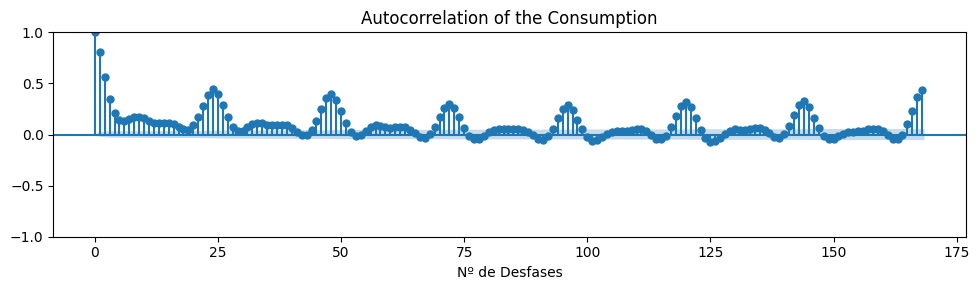

In [212]:
fig, ax = plt.subplots(figsize=(10, 3))
plt.xlabel("Nº de Desfases")
plot_acf(merged_df["Consumo"], ax=ax, lags=24*7)
plt.title("Autocorrelation of the Consumption")
plt.tight_layout()
plt.savefig("../results/autocorrelacion_semana.png", bbox_inches='tight', dpi=300)
plt.show()

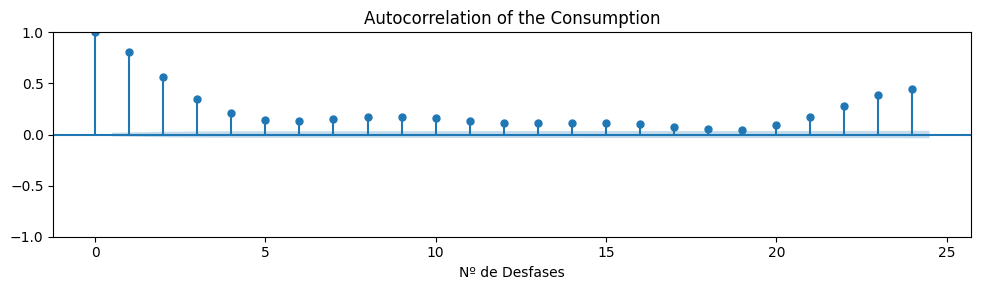

In [213]:
fig, ax = plt.subplots(figsize=(10, 3))
plt.xlabel("Nº de Desfases")
plot_acf(merged_df["Consumo"], ax=ax, lags=24)
plt.title("Autocorrelation of the Consumption")
plt.tight_layout()
plt.savefig("../results/autocorrelacion_dia.png", bbox_inches='tight', dpi=300)
plt.show()

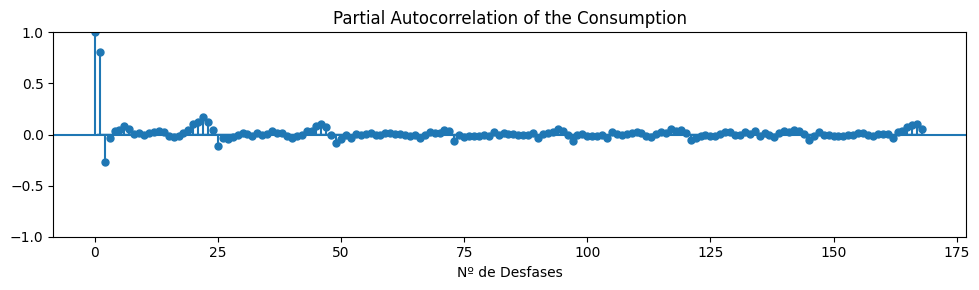

In [214]:
fig, ax = plt.subplots(figsize=(10, 3))
plt.xlabel("Nº de Desfases")
plot_pacf(merged_df["Consumo"], ax=ax, lags=24*7)
plt.title("Partial Autocorrelation of the Consumption")
plt.tight_layout()
plt.savefig("../results/autocorrelacion_parcial_semana.png", bbox_inches='tight', dpi=300)
plt.show()

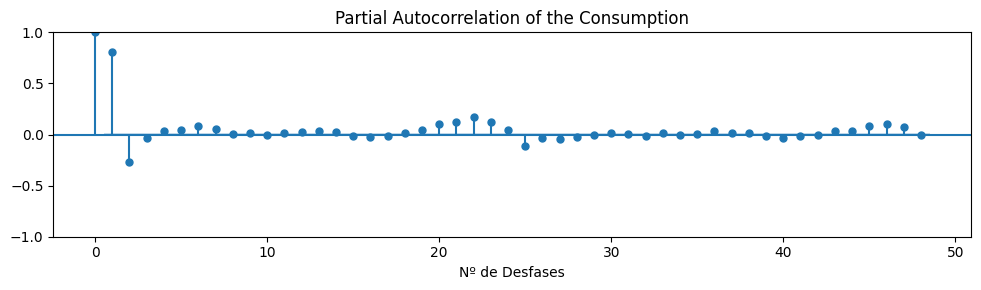

In [215]:
fig, ax = plt.subplots(figsize=(10, 3))
plt.xlabel("Nº de Desfases")
plot_pacf(merged_df["Consumo"], ax=ax, lags=48)
plt.title("Partial Autocorrelation of the Consumption")
plt.tight_layout()
plt.savefig("../results/autocorrelacion_parcial_dia.png", bbox_inches='tight', dpi=300)
plt.show()

## Exogenous Variables

In [216]:
# Fields extracted directly from the Date
merged_df["Year"] = merged_df["Date"].dt.year
merged_df["Month"] = merged_df["Date"].dt.month
merged_df["Hour"] = merged_df["Date"].dt.hour
merged_df["DayOfWeek"] = merged_df["Date"].dt.day_of_week
merged_df["DayOfYear"] = merged_df["Date"].dt.day_of_year
merged_df["Day"] = merged_df["Date"].dt.day

In [217]:
merged_df

,Date,Consumo,temperature_2m_C,relative_humidity_2m_%,dew_point_2m_C,apparent_temperature_C,pressure_msl_hPa,surface_pressure_hPa,cloud_cover_%,cloud_cover_high_%,...,direct_normal_irradiance_W/m2,global_tilted_irradiance_W/m2,terrestrial_radiation_W/m2,Temp_interna_Modulo_C,Year,Month,Hour,DayOfWeek,DayOfYear,Day
4368,2022-07-02 00:00:00,3.0,20.259000,84.817234,17.602751,22.359378,1020.012500,1014.212769,0.562500,0.000,...,0.000000,0.00,0.00000,26.384071,2022,7,0,5,183,2
4369,2022-07-02 01:00:00,2.0,19.277750,89.401823,17.490251,21.180619,1019.587522,1013.770798,0.000000,0.000,...,0.000000,0.00,0.00000,25.940834,2022,7,1,5,183,2
4370,2022-07-02 02:00:00,3.0,19.715250,88.562090,17.771502,21.657682,1019.212500,1013.406601,0.000000,0.000,...,0.000000,0.00,0.00000,26.138456,2022,7,2,5,183,2
4371,2022-07-02 03:00:00,2.0,19.759000,88.008093,17.715251,21.494984,1018.787500,1012.984924,0.000000,0.000,...,0.000000,0.00,0.00000,26.158218,2022,7,3,5,183,2
4372,2022-07-02 04:00:00,3.0,19.609001,88.203276,17.602750,21.462321,1018.562487,1012.758133,4.837500,16.125,...,9.129443,3.75,18.89632,26.297756,2022,7,4,5,183,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16771,2023-11-30 19:00:00,6.0,17.527750,79.080132,13.859000,15.473409,1003.050000,997.213232,26.625001,85.000,...,0.000000,0.00,0.00000,25.150345,2023,11,19,3,334,30
16772,2023-11-30 20:00:00,5.0,17.577750,78.784395,13.846500,15.383718,1003.050000,997.213232,23.250002,76.750,...,0.000000,0.00,0.00000,25.172930,2023,11,20,3,334,30
16773,2023-11-30 21:00:00,4.0,18.015251,75.550207,13.627749,15.511757,1003.050000,997.213232,14.025001,44.000,...,0.000000,0.00,0.00000,25.370553,2023,11,21,3,334,30
16774,2023-11-30 22:00:00,2.0,18.209001,74.234406,13.546500,15.470847,1003.050000,997.213232,18.075001,55.875,...,0.000000,0.00,0.00000,25.458071,2023,11,22,3,334,30


In [218]:
#Sine and Cosine Transformations
def cyclical_encoding(df, cycle_length_list, columns):
    for col, cycle_length in zip(columns, cycle_length_list):
        if df[col].min == 0:
            df[f"{col}_sin"] = np.sin((df[col] / cycle_length) * np.pi * 2).round(4)
            df[f"{col}_cos"] = np.cos((df[col] / cycle_length) * np.pi * 2).round(4)
        else:
            df[f"{col}_sin"] = np.sin(((df[col] - 1) / cycle_length) * np.pi * 2).round(4)
            df[f"{col}_cos"] = np.cos(((df[col] - 1) / cycle_length) * np.pi * 2).round(4)
    return df

#Add isWeekend Column based in DayOfTheWeek Value
merged_df["isWeekend"] = merged_df["DayOfWeek"].isin([5, 6])
cycle_lengths = [24, 7, 12, 365]
cols = ["Hour", "DayOfWeek", "Month", "DayOfYear"]

#Encode cyclical fields using sin/cos transformation
merged_df = cyclical_encoding(merged_df, cycle_lengths, cols)

merged_df.head(3)

,Date,Consumo,temperature_2m_C,relative_humidity_2m_%,dew_point_2m_C,apparent_temperature_C,pressure_msl_hPa,surface_pressure_hPa,cloud_cover_%,cloud_cover_high_%,...,Day,isWeekend,Hour_sin,Hour_cos,DayOfWeek_sin,DayOfWeek_cos,Month_sin,Month_cos,DayOfYear_sin,DayOfYear_cos
4368,2022-07-02 00:00:00,3.0,20.25900,84.817234,17.602751,22.359378,1020.012500,1014.212769,0.5625,0.0,...,2,True,-0.2588,0.9659,-0.4339,-0.901,0.0,-1.0,0.0086,-1.0
4369,2022-07-02 01:00:00,2.0,19.27775,89.401823,17.490251,21.180619,1019.587522,1013.770798,0.0000,0.0,...,2,True,0.0000,1.0000,-0.4339,-0.901,0.0,-1.0,0.0086,-1.0
4370,2022-07-02 02:00:00,3.0,19.71525,88.562090,17.771502,21.657682,1019.212500,1013.406601,0.0000,0.0,...,2,True,0.2588,0.9659,-0.4339,-0.901,0.0,-1.0,0.0086,-1.0


In [219]:
def generateHolidayVar(df):
    df["Reduced_Date"] = df["Date"].dt.date
    list_holidays = holidays.Spain(prov="CT", years=list(df["Year"].unique()))
    list_holidays_dates = np.array(list(list_holidays.keys()), dtype='datetime64')
    df["isHoliday"] = df["Reduced_Date"].isin(list_holidays_dates)
    df = df.drop('Reduced_Date', axis=1)
    return df

merged_df = generateHolidayVar(merged_df)

In [220]:
nan_rows = merged_df['temperature_2m_C'].isna().sum()
nan_rows

0

In [221]:
grafico_zoom(merged_df["Date"], merged_df["Consumo"],
              "Bounded Electricity Consumption Dataset", "Consumption [kWh]", filename="curva_consumo_acotado")

In [222]:
def createClusters(df):
    cluster_df = df.copy(deep=True)
    cluster_df.set_index("Date", inplace=True)
    cluster_df = cluster_df[["temperature_2m_C"]]
    cluster_df = cluster_df.resample('1D').mean()
    cluster_df = cluster_df.dropna()
    cluster_df.reset_index(inplace=True)
    scaler = MinMaxScaler()
    cluster_df['temp_sta'] = scaler.fit_transform(cluster_df[["temperature_2m_C"]])
    dist_matrix = pdist(cluster_df[['temp_sta']], metric='euclidean')
    linked = linkage(dist_matrix, method="centroid")
    cluster_df['temp_cluster'] = fcluster(linked, 3, criterion='maxclust')

    #Gráfico del valor de la variable cluster
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=cluster_df.Date, y=cluster_df["temp_cluster"], mode='lines'))
    fig.update_layout(
        title = "Clusters de Temperaturas por Fechas",
        xaxis_title = "Fecha",
        yaxis_title = "Cluster de Temperatura",
        width = 850,
        height = 400,
        margin=dict(l=20, r=20, t=35, b=20),
        legend=dict(
            orientation="h",
            yanchor="top",
            y=1,
            xanchor="left",
            x=0.001
        )
    )
    fig.show()
    return cluster_df

cluster_df = createClusters(merged_df)

In [223]:
cluster_df.set_index("Date", inplace=True)
cluster_df = cluster_df.resample('15min').ffill().reset_index()
merged_df = merged_df.merge(cluster_df[["Date", "temp_cluster"]], on="Date", how='inner')
merged_df.reset_index(inplace=True, drop=True)

## Other Plots

### Consumption Distribution per Hour of the Day

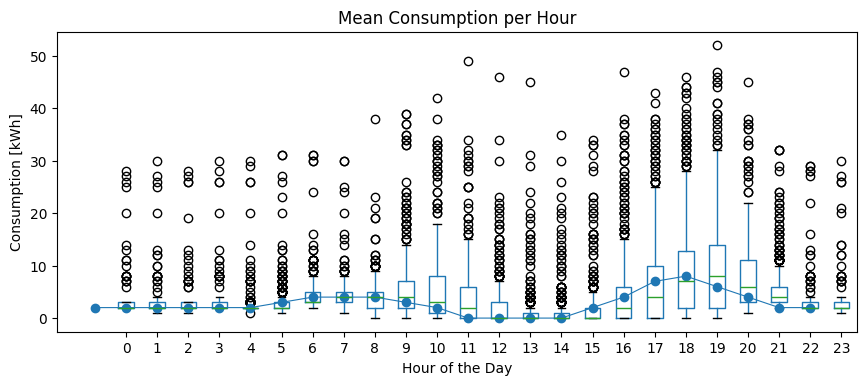

In [224]:
fig, ax = plt.subplots(figsize=(10, 4))
merged_df.boxplot(column='Consumo', by='Hour', ax=ax)
merged_df.groupby('Hour')['Consumo'].median().plot(style='o-', linewidth=.8, ax=ax)
ax.set_ylabel('Consumption [kWh]')
ax.set_xlabel('Hour of the Day')
ax.set_title("Mean Consumption per Hour")
fig.suptitle('')
plt.savefig("../results/consumo_hora.png", bbox_inches='tight', dpi=300)

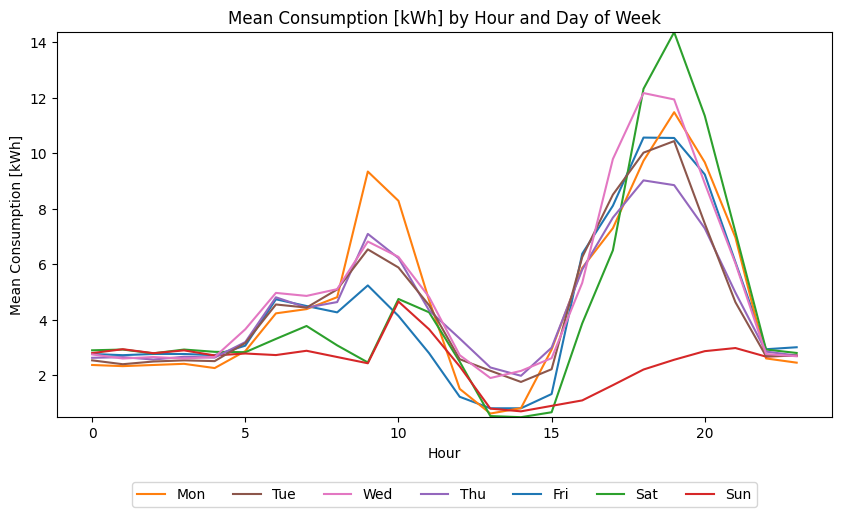

In [225]:
days_mapping = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}
merged_df["Day"] = merged_df["DayOfWeek"].map(days_mapping)
grouped = merged_df.groupby([merged_df['Hour'], merged_df['Day']])['Consumo'].mean().unstack()

fig, axes = plt.subplots(1, 1, figsize=(10, 5))

ymin, ymax = grouped.min().min(), grouped.max().max()
grouped.plot(ax=axes, ylim=(ymin, ymax), title="", legend=True)

# LEGEND
handles, labels = axes.get_legend_handles_labels()
order = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
ordered_handles = [handles[labels.index(day)] for day in order]
axes.legend(ordered_handles, order, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=7, frameon=True)
plt.xlabel('Hour')
plt.ylabel('Mean Consumption [kWh]')
plt.title('Mean Consumption [kWh] by Hour and Day of Week')
plt.savefig("../results/weekly_seasonality.png", bbox_inches='tight', dpi=300)
plt.show()

In [226]:
start_date = merged_df.Date.min() + timedelta(days=62)
end_date = start_date + timedelta(days=31)
df_month1 = merged_df.loc[(merged_df.Date >= start_date) & (merged_df.Date <= end_date)]
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_month1.Date, y=df_month1["Consumo"], mode='lines'))
fig.update_layout(
    title = "One Month Consumption",
    xaxis_title = "Date",
    yaxis_title = "COnsumption [kWh]",
    width = 850,
    height = 400,
    margin=dict(l=20, r=20, t=35, b=20),
    legend=dict(
        orientation="h",
        yanchor="top",
        y=1,
        xanchor="left",
        x=0.001
    )
)
fig.show()

### Consumption Distribution per Month

Text(0.5, 0.98, '')

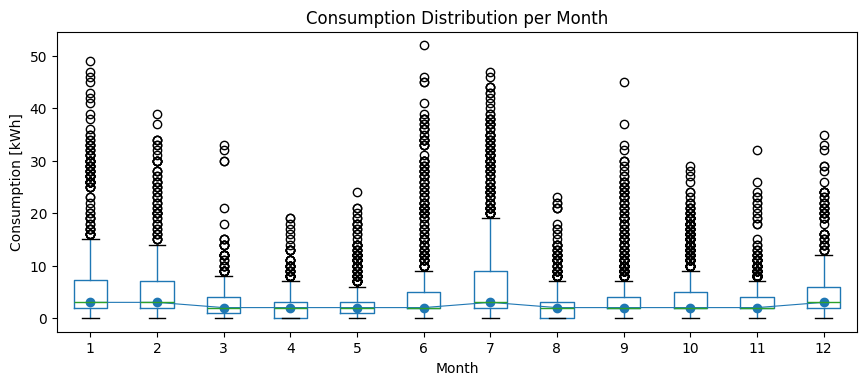

In [227]:
fig, ax = plt.subplots(figsize=(10, 4))
merged_df.boxplot(column='Consumo', by='Month', ax=ax)
merged_df.groupby('Month')['Consumo'].median().plot(style='o-', linewidth=.8, ax=ax)
ax.set_ylabel('Consumption [kWh]')
ax.set_title("Consumption Distribution per Month")
fig.suptitle('')

### Month to Month Consumption

In [228]:
def plot_monthly_Consumption(dataframe, filename):
    df = dataframe.copy(deep=True)
    df.set_index("Date", inplace=True)

    if not pd.api.types.is_datetime64_any_dtype(df.index):
        df.index = pd.to_datetime(df.index)
    
    groups = df.groupby([df.index.year, df.index.month])
    fig = make_subplots(rows=6, cols=2, subplot_titles=[calendar.month_name[i] for i in range(1, 13)], horizontal_spacing=0.1, vertical_spacing=0.05)
    colors = ['blue', 'orange', 'green']

    for month in range(1, 13):
        row = (month - 1) // 2 + 1
        col = (month - 1) % 2 + 1
        monthly_data = df[df.index.month == month]
        unique_years = monthly_data.index.year.unique()
        for i, year in enumerate(unique_years):
            year_data = monthly_data[monthly_data.index.year == year]
            year_data = year_data.copy(deep=True)
            year_data.index = year_data.index.map(lambda x: x.replace(year=2022))  
            fig.add_trace(
                go.Scatter(x=year_data.index, y=year_data["Consumo"], mode='lines', name=f"{year}",
                           legendgroup=f"{month}", line=dict(color=colors[i % len(colors)]), showlegend=False),
                row=row, col=col
            )
        fig.update_xaxes(title_text="Date", row=row, col=col)
        fig.update_yaxes(title_text="Consumption [kWh]", row=row, col=col)
    unique_years = df.index.year.unique()
    for i, year in enumerate(unique_years):
                fig.add_trace(
                    go.Scatter(x=[None], y=[None], mode='lines', name=f"{year}",
                            legendgroup=f"{month}", line=dict(color=colors[i % len(colors)]), showlegend=True),
                    row=row, col=col
                )
    fig.update_layout(
        title = {
            "text": "Month to Month Consumption",
            'x': 0.5,
            'xanchor': 'center'
        },
        xaxis_title="Date",
        yaxis_title="Consumption [kWh]",
        width=1200,
        height=2000,
        margin=dict(l=20, r=20, t=45, b=20)   
    )
    # if filename is not None:
    #     # fig.write_image(f"../results/{filename}.png", scale=2, format="png")
    fig.show()
plot_monthly_Consumption(merged_df, "consumption_per_month")

### Consumption per Hour, Day and Season

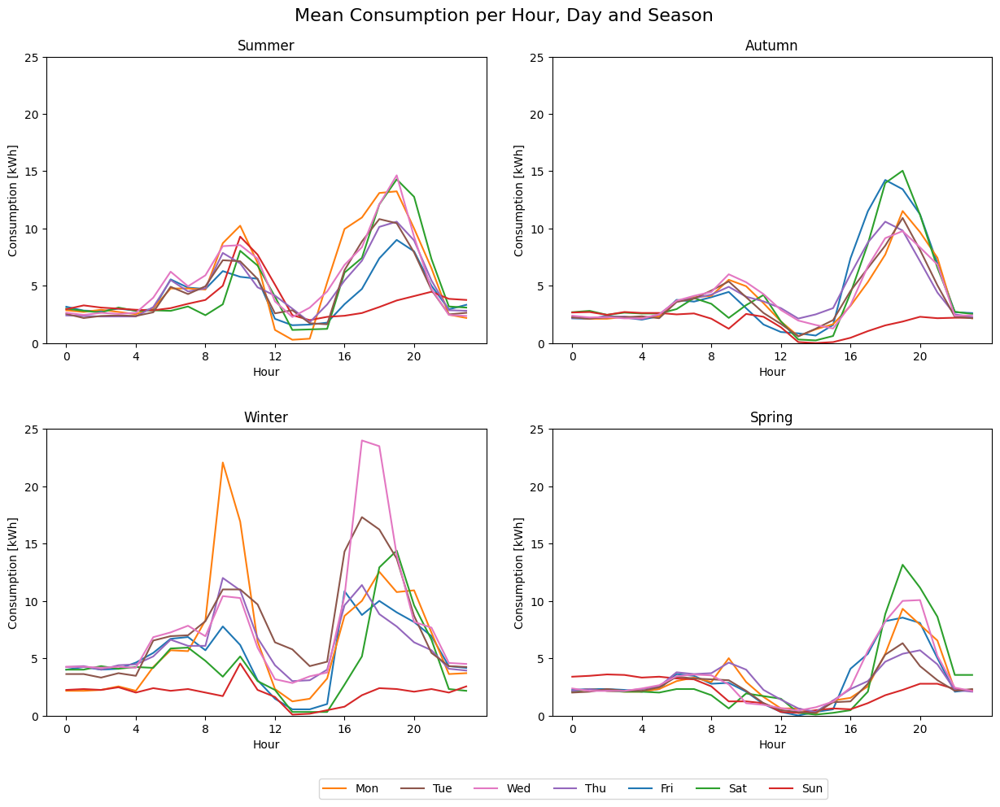

In [229]:
days_mapping = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}
merged_df["Day"] = merged_df["DayOfWeek"].map(days_mapping)
merged_df["Season"] = merged_df["Month"].apply(
    lambda x: (
        1 if x in [3, 4, 5] #Spring
        else 2 if x in [6, 7, 8] #Summer
        else 3 if x in [9, 10, 11] #Autumn
        else 0 #Winter
    )
)
fig, axes = plt.subplots(2, 2)
plt.subplots_adjust(wspace=0.15, hspace=0.3, top=0.92)
fig.suptitle("Mean Consumption per Hour, Day and Season", fontsize=16)

fig.set_figheight(10)
fig.set_figwidth(15)

ymin, ymax = 0, 25

#Season Summer
merged_df.loc[merged_df["Season"] == 2] \
    .groupby([merged_df.loc[merged_df["Season"] == 2]["Hour"], 'Day'])["Consumo"].mean().unstack().plot(
        ax=axes[0, 0], ylim=(ymin, ymax), title="Summer", legend=False
    )
merged_df.loc[merged_df["Season"] == 3] \
    .groupby([merged_df.loc[merged_df["Season"] == 3]["Hour"], 'Day'])["Consumo"].mean().unstack().plot(
        ax=axes[0, 1], ylim=(ymin, ymax), title="Autumn", legend=False
    )
merged_df.loc[merged_df["Season"] == 0] \
    .groupby([merged_df.loc[merged_df["Season"] == 0]["Hour"], 'Day'])["Consumo"].mean().unstack().plot(
        ax=axes[1, 0], ylim=(ymin, ymax), title="Winter", legend=False
    )
merged_df.loc[merged_df["Season"] == 1] \
    .groupby([merged_df.loc[merged_df["Season"] == 1]["Hour"], 'Day'])["Consumo"].mean().unstack().plot(
        ax=axes[1, 1], ylim=(ymin, ymax), title="Spring", legend=False
    )

for ax in axes.flat:
    ax.set(xlabel='Hour', ylabel='Consumption [kWh]')

for n in range(0, 2):
    axes[n, 0].set_xticks([0, 4, 8, 12, 16, 20])
    axes[n, 1].set_xticks([0, 4, 8, 12, 16, 20])
merged_df = merged_df.drop("Day", axis=1)
# LEGEND
handles, labels = plt.gca().get_legend_handles_labels() # reorder Legend Labels
order = [1,5,6,4,0,2,3]      # specify order in Legend
axes[1,1].legend([handles[i] for i in order], [labels[i] for i in order], loc=1, ncol=7, 
                 bbox_to_anchor=(0.638,-0.2), frameon=True) # print and order LEGEND

plt.savefig("../results/consumo_estacion.png", bbox_inches='tight', dpi=300)

In [230]:
merged_df[["Consumo"]].describe()

,Consumo
count,12048.000000
mean,4.261122
std,5.819456
min,0.000000
25%,2.000000
50%,2.000000
75%,5.000000
max,52.000000


### Relationship between Consumption and Temperature. 

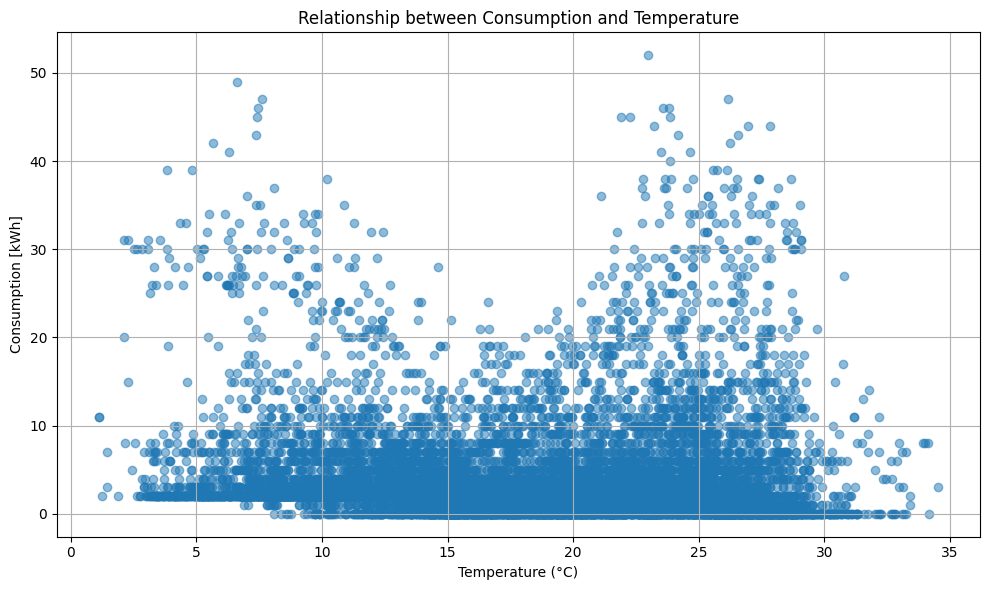

In [231]:
def plot_temp_vs_consumption(df):
    df = df.copy(deep=True)
    df.set_index("Date", inplace=True)
    plt.figure(figsize=(10, 6))
    plt.scatter(df['temperature_2m_C'], df['Consumo'], alpha=0.5)
    plt.title('Relationship between Consumption and Temperature')
    plt.xlabel('Temperature (°C)')
    plt.ylabel('Consumption [kWh]')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("../results/scatterplot_consumo_temp.png", bbox_inches='tight', dpi=300)
    plt.show()
plot_temp_vs_consumption(merged_df)

### Correlation Matrix (Lollipop Chart)

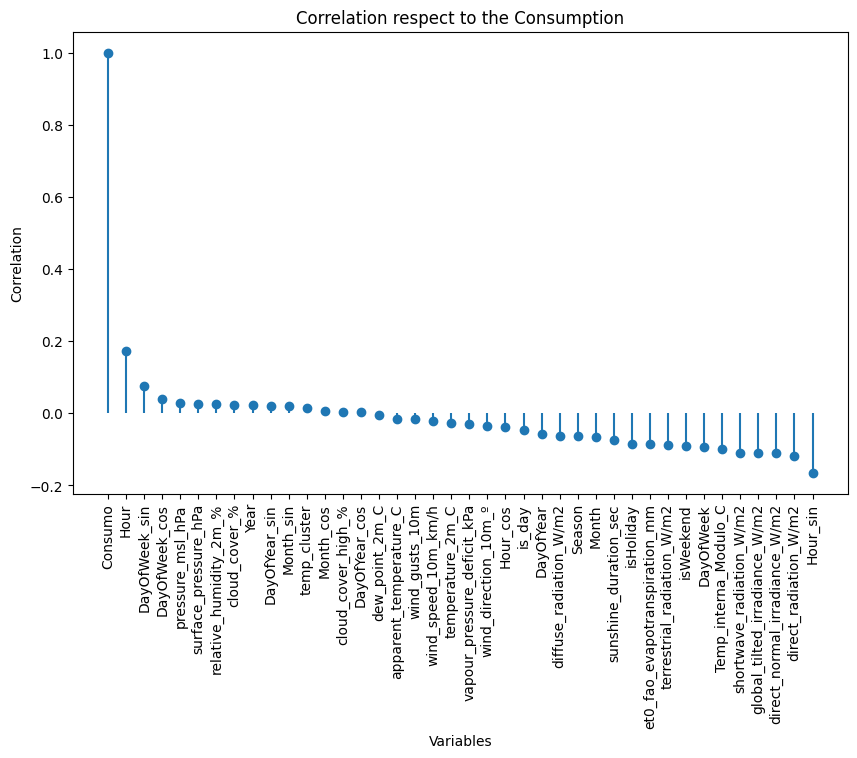

In [232]:
merged_df.set_index("Date", inplace=True)
correlation_matrix = merged_df.corr()
merged_df.reset_index(inplace=True)
sorted_correlation = correlation_matrix.sort_values(by='Consumo', ascending=False)

# Crear un gráfico lollipop de la correlación respecto a la variable específica
plt.figure(figsize=(10, 6))
plt.stem(sorted_correlation.index, sorted_correlation['Consumo'], basefmt=" ")
plt.title('Correlation respect to the Consumption')
plt.xlabel('Variables')
plt.ylabel('Correlation')
plt.xticks(rotation=90)
plt.show()

In [233]:
merged_df

,Date,Consumo,temperature_2m_C,relative_humidity_2m_%,dew_point_2m_C,apparent_temperature_C,pressure_msl_hPa,surface_pressure_hPa,cloud_cover_%,cloud_cover_high_%,...,Hour_cos,DayOfWeek_sin,DayOfWeek_cos,Month_sin,Month_cos,DayOfYear_sin,DayOfYear_cos,isHoliday,temp_cluster,Season
0,2022-07-02 00:00:00,3.0,20.259000,84.817234,17.602751,22.359378,1020.012500,1014.212769,0.562500,0.000,...,0.9659,-0.4339,-0.9010,0.000,-1.0,0.0086,-1.0000,False,3,2
1,2022-07-02 01:00:00,2.0,19.277750,89.401823,17.490251,21.180619,1019.587522,1013.770798,0.000000,0.000,...,1.0000,-0.4339,-0.9010,0.000,-1.0,0.0086,-1.0000,False,3,2
2,2022-07-02 02:00:00,3.0,19.715250,88.562090,17.771502,21.657682,1019.212500,1013.406601,0.000000,0.000,...,0.9659,-0.4339,-0.9010,0.000,-1.0,0.0086,-1.0000,False,3,2
3,2022-07-02 03:00:00,2.0,19.759000,88.008093,17.715251,21.494984,1018.787500,1012.984924,0.000000,0.000,...,0.8660,-0.4339,-0.9010,0.000,-1.0,0.0086,-1.0000,False,3,2
4,2022-07-02 04:00:00,3.0,19.609001,88.203276,17.602750,21.462321,1018.562487,1012.758133,4.837500,16.125,...,0.7071,-0.4339,-0.9010,0.000,-1.0,0.0086,-1.0000,False,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12043,2023-11-29 20:00:00,8.0,11.190250,92.669918,10.046500,10.525317,1004.975000,999.079224,29.550002,97.000,...,0.2588,0.7818,0.6235,-0.866,0.5,-0.5380,0.8429,False,1,3
12044,2023-11-29 21:00:00,8.0,11.140250,90.235245,9.596500,10.341212,1004.487477,998.593491,29.475001,93.500,...,0.5000,0.7818,0.6235,-0.866,0.5,-0.5380,0.8429,False,1,3
12045,2023-11-29 22:00:00,3.0,11.609000,87.170971,9.546500,10.604668,1004.300000,998.416656,24.637501,76.125,...,0.7071,0.7818,0.6235,-0.866,0.5,-0.5380,0.8429,False,1,3
12046,2023-11-29 23:00:00,2.0,12.221500,85.602179,9.877750,10.940205,1004.187500,998.317459,22.012500,64.375,...,0.8660,0.7818,0.6235,-0.866,0.5,-0.5380,0.8429,False,1,3


In [234]:
def calculate_log_returns(y, h, epsilon=1e-6):

    y_adjusted = np.clip(y, epsilon, None)
    log_returns = np.log(y_adjusted[h:] / y_adjusted[:-h])

    return log_returns

def calculate_volatility(y, h, H):
    log_returns = calculate_log_returns(y, h)
    N = len(log_returns)

    volatilities = []

    # Recorremos la serie en ventanas de tamaño H
    for i in range(N - H + 1):
        windowed_returns = log_returns[i:i + H]
        mean_returns = np.mean(windowed_returns)
        volatility = np.sqrt(np.sum((windowed_returns - mean_returns) ** 2) / (H - 1))
        volatilities.append(volatility)
    
    return np.array(volatilities)
h = 1
H = 5
volatilities = calculate_volatility(merged_df["Consumo"].values, h, H)

fig = go.Figure()
trace1 = go.Scatter(x=merged_df["Date"], y=merged_df["Consumo"], name="real", mode="lines")
trace2 = go.Scatter(x=merged_df["Date"], y=volatilities, name="volatility", mode="lines")
fig.add_trace(trace1)
fig.add_trace(trace2)
fig.update_layout(
    title="Time Series vs Volatility",
    xaxis_title="Date Time",
    yaxis_title="Consumption [kWh]",
    yaxis2=dict(
        title="Volatility",          
        overlaying="y",         
        side="right",                 
        showgrid=False,               
        zeroline=False
    ),
    width=1020,
    height=450,
    margin = dict(l=70, r=20, t=55, b=20),
    legend = dict(
        orientation = "h",
        yanchor="top",
        y=1.1,
        xanchor="left",
        x=0.5
    )
)
fig.show()


## Save Dataset

In [235]:
# Save the Dataframe into a csv
nombre_archivo = "LaMonserratina_CLEAN.csv"
merged_df.to_csv("../data/data_casal_montserratina/LaMonserratina_CLEAN.csv", index=False)

In [236]:
merged_df.shape

(12048, 41)